In [1]:
import numpy as np
import math
import random
import os
import torch
import scipy.spatial.distance
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import time

import plotly.graph_objects as go
import plotly.express as px

In [2]:
# torch.cuda.empty_cache()

In [3]:
!pip install path.py;
from path import Path

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.0 -> 24.1.1
[notice] To update, run: python -m pip install --upgrade pip


In [4]:
random.seed = int(time.time())

In [5]:
# !wget http://3dvision.princeton.edu/projects/2014/3DShapeNets/ModelNet10.zip

In [6]:
# !unzip -q ModelNet10.zip;

In [7]:
path = Path("ModelNet10")

In [8]:
folders = [dir for dir in sorted(os.listdir(path)) if os.path.isdir(path/dir)]
classes = {folder: i for i, folder in enumerate(folders)};
classes

{'bathtub': 0,
 'bed': 1,
 'chair': 2,
 'desk': 3,
 'dresser': 4,
 'monitor': 5,
 'night_stand': 6,
 'sofa': 7,
 'table': 8,
 'toilet': 9}

In [9]:
def read_off(file):
    if 'OFF' != file.readline().strip():
        raise('Not a valid OFF header')
    n_verts, n_faces, __ = tuple([int(s) for s in file.readline().strip().split(' ')])
    verts = [[float(s) for s in file.readline().strip().split(' ')] for i_vert in range(n_verts)]
    faces = [[int(s) for s in file.readline().strip().split(' ')][1:] for i_face in range(n_faces)]
    return verts, faces

In [10]:
with open(path/"chair/train/chair_0887.off", 'r') as f:
  verts, faces = read_off(f)

In [11]:
i,j,k = np.array(faces).T
x,y,z = np.array(verts).T

In [12]:
len(x)

16500

In [13]:
def visualize_rotate(data):
    x_eye, y_eye, z_eye = 1.25, 1.25, 0.8
    frames=[]

    def rotate_z(x, y, z, theta):
        w = x+1j*y
        return np.real(np.exp(1j*theta)*w), np.imag(np.exp(1j*theta)*w), z

    for t in np.arange(0, 10.26, 0.1):
        xe, ye, ze = rotate_z(x_eye, y_eye, z_eye, -t)
        frames.append(dict(layout=dict(scene=dict(camera=dict(eye=dict(x=xe, y=ye, z=ze))))))
    fig = go.Figure(data=data,
                    layout=go.Layout(
                        updatemenus=[dict(type='buttons',
                                    showactive=False,
                                    y=1,
                                    x=0.8,
                                    xanchor='left',
                                    yanchor='bottom',
                                    pad=dict(t=45, r=10),
                                    buttons=[dict(label='Play',
                                                    method='animate',
                                                    args=[None, dict(frame=dict(duration=50, redraw=True),
                                                                    transition=dict(duration=0),
                                                                    fromcurrent=True,
                                                                    mode='immediate'
                                                                    )]
                                                    )
                                            ]
                                    )
                                ]
                    ),
                    frames=frames
            )

    return fig

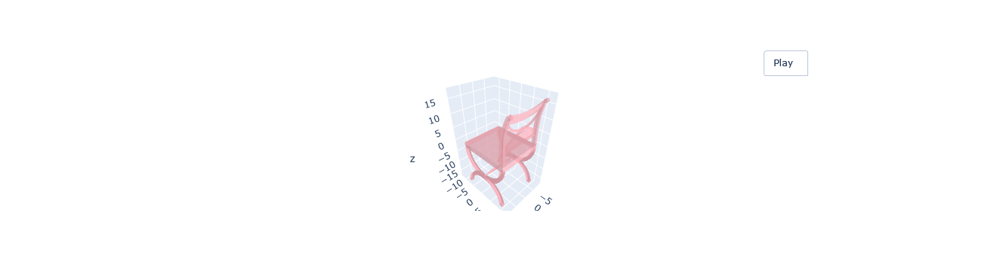

In [14]:
visualize_rotate([go.Mesh3d(x=x, y=y, z=z, color='lightpink', opacity=0.50, i=i,j=j,k=k)]).show()

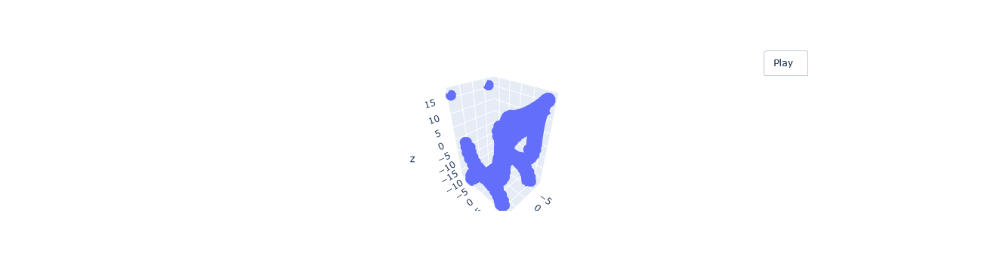

In [15]:
visualize_rotate([go.Scatter3d(x=x, y=y, z=z,
                                   mode='markers')]).show()

In [16]:
def pcshow(xs,ys,zs):
    data=[go.Scatter3d(x=xs, y=ys, z=zs,
                                   mode='markers')]
    fig = visualize_rotate(data)
    fig.update_traces(marker=dict(size=2,
                      line=dict(width=2,
                      color='DarkSlateGrey')),
                      selector=dict(mode='markers'))
    fig.show()


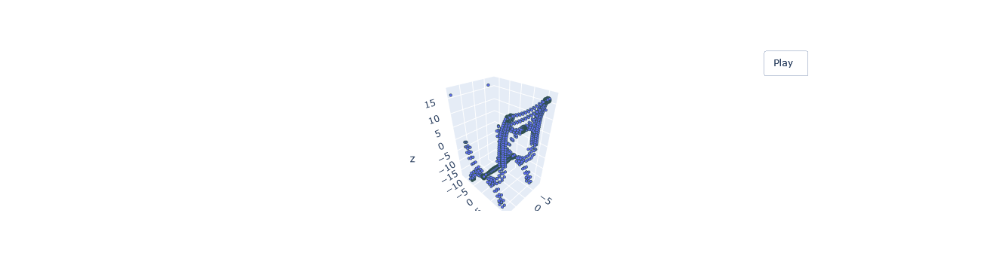

In [17]:
pcshow(x,y,z)

In [18]:
class PointSampler(object):
    def __init__(self, output_size):
        assert isinstance(output_size, int)
        self.output_size = output_size

    def triangle_area(self, pt1, pt2, pt3):
        side_a = np.linalg.norm(pt1 - pt2)
        side_b = np.linalg.norm(pt2 - pt3)
        side_c = np.linalg.norm(pt3 - pt1)
        s = 0.5 * ( side_a + side_b + side_c)
        return max(s * (s - side_a) * (s - side_b) * (s - side_c), 0)**0.5

    def sample_point(self, pt1, pt2, pt3):
        # barycentric coordinates on a triangle
        # https://mathworld.wolfram.com/BarycentricCoordinates.html
        s, t = sorted([random.random(), random.random()])
        f = lambda i: s * pt1[i] + (t-s)*pt2[i] + (1-t)*pt3[i]
        return (f(0), f(1), f(2))


    def __call__(self, mesh):
        verts, faces = mesh
        verts = np.array(verts)
        areas = np.zeros((len(faces)))

        for i in range(len(areas)):
            areas[i] = (self.triangle_area(verts[faces[i][0]],
                                           verts[faces[i][1]],
                                           verts[faces[i][2]]))

        sampled_faces = (random.choices(faces,
                                      weights=areas,
                                      cum_weights=None,
                                      k=self.output_size))

        sampled_points = np.zeros((self.output_size, 3))

        for i in range(len(sampled_faces)):
            sampled_points[i] = (self.sample_point(verts[sampled_faces[i][0]],
                                                   verts[sampled_faces[i][1]],
                                                   verts[sampled_faces[i][2]]))

        return sampled_points


In [19]:
pointcloud = PointSampler(512)((verts, faces))

In [20]:
# pcshow(*pointcloud.T)

In [21]:
class Normalize(object):
    def __call__(self, pointcloud):
        assert len(pointcloud.shape)==2

        norm_pointcloud = pointcloud - np.mean(pointcloud, axis=0)
        norm_pointcloud /= np.max(np.linalg.norm(norm_pointcloud, axis=1))

        return  norm_pointcloud

In [22]:
norm_pointcloud = Normalize()(pointcloud)

In [23]:
# pcshow(*norm_pointcloud.T)

In [24]:
class RandRotation_z(object):
    def __call__(self, pointcloud):
        assert len(pointcloud.shape)==2

        theta = random.random() * 2. * math.pi
        rot_matrix = np.array([[ math.cos(theta), -math.sin(theta),    0],
                               [ math.sin(theta),  math.cos(theta),    0],
                               [0,                             0,      1]])

        rot_pointcloud = rot_matrix.dot(pointcloud.T).T
        return  rot_pointcloud

class RandomNoise(object):
    def __call__(self, pointcloud):
        assert len(pointcloud.shape)==2

        noise = np.random.normal(0, 0.02, (pointcloud.shape))

        noisy_pointcloud = pointcloud + noise
        return  noisy_pointcloud

In [25]:
rot_pointcloud = RandRotation_z()(norm_pointcloud)
noisy_rot_pointcloud = RandomNoise()(rot_pointcloud)

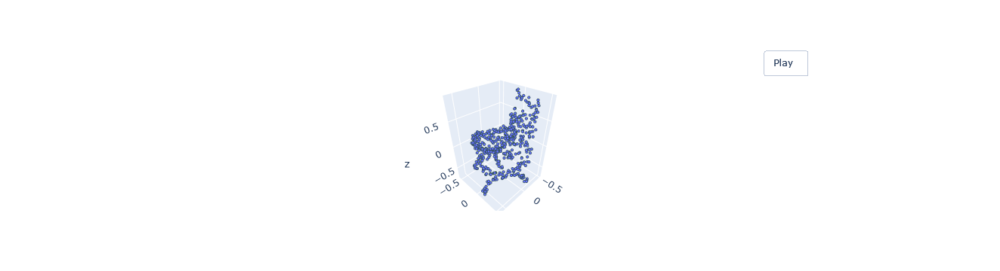

In [26]:
pcshow(*noisy_rot_pointcloud.T)

In [27]:
class ToTensor(object):
    def __call__(self, pointcloud):
        assert len(pointcloud.shape)==2

        return torch.from_numpy(pointcloud)

In [28]:
test5 = ToTensor()(noisy_rot_pointcloud)

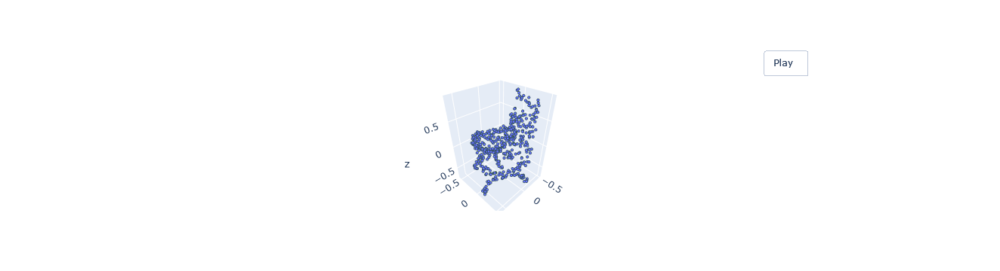

In [29]:
pcshow(*test5.T)

In [30]:
def default_transforms():
    return transforms.Compose([
                                PointSampler(512),
                                Normalize(),
                                ToTensor()
                              ])

In [31]:
class PointCloudData(Dataset):
    def __init__(self, root_dir, valid=False, folder="train", transform=default_transforms()):
        self.root_dir = root_dir
        folders = [dir for dir in sorted(os.listdir(root_dir)) if os.path.isdir(root_dir/dir)]
        self.classes = {folder: i for i, folder in enumerate(folders)}
        self.transforms = transform if not valid else default_transforms()
        self.valid = valid
        self.files = []
        for category in self.classes.keys():
            new_dir = root_dir/Path(category)/folder
            for file in os.listdir(new_dir):
                if file.endswith('.off'):
                    sample = {}
                    sample['pcd_path'] = new_dir/file
                    sample['category'] = category
                    self.files.append(sample)

    def __len__(self):
        return len(self.files)

    def __preproc__(self, file):
        verts, faces = read_off(file)
        if self.transforms:
            pointcloud = self.transforms((verts, faces))
        return pointcloud

    def __getitem__(self, idx):
        pcd_path = self.files[idx]['pcd_path']
        category = self.files[idx]['category']
        with open(pcd_path, 'r') as f:
            pointcloud = self.__preproc__(f)
        return {'pointcloud': pointcloud,
                'category': self.classes[category]}

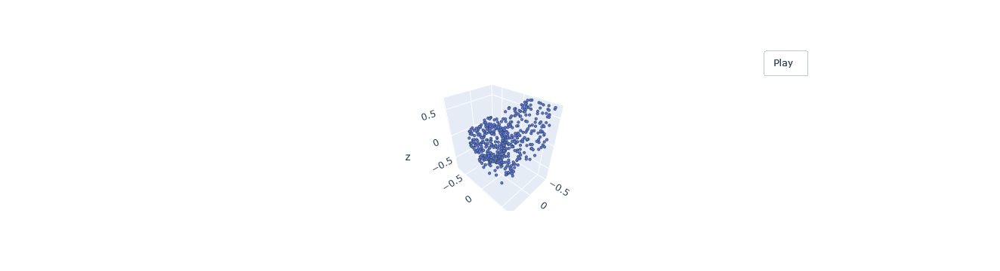

In [32]:
test = PointCloudData(path).__getitem__(3990)['pointcloud']
pcshow(*test.T)

In [33]:
train_transforms = transforms.Compose([
                    PointSampler(512),
                    Normalize(),
                    RandRotation_z(),
                    RandomNoise(),
                    ToTensor()
                    ])

In [34]:
train_ds = PointCloudData(path, transform=train_transforms)
valid_ds = PointCloudData(path, valid=True, folder='test', transform=train_transforms)

In [35]:
inv_classes = {i: cat for cat, i in train_ds.classes.items()};
inv_classes

{0: 'bathtub',
 1: 'bed',
 2: 'chair',
 3: 'desk',
 4: 'dresser',
 5: 'monitor',
 6: 'night_stand',
 7: 'sofa',
 8: 'table',
 9: 'toilet'}

In [36]:
train_loader = DataLoader(dataset=train_ds, batch_size=32, shuffle=True)
valid_loader = DataLoader(dataset=valid_ds, batch_size=64)

In [37]:
import torch
import torch.nn as nn
import numpy as np
import torch.nn.functional as F

class Tnet(nn.Module): #Tnet(k=64)
   def __init__(self, k=3):
      super().__init__()
      self.k=k
      self.conv1 = nn.Conv1d(k,64,1)
      self.conv2 = nn.Conv1d(64,128,1)
      self.conv3 = nn.Conv1d(128,1024,1)
      self.fc1 = nn.Linear(1024,512)
      self.fc2 = nn.Linear(512,256)
      self.fc3 = nn.Linear(256,k*k)

      self.bn1 = nn.BatchNorm1d(64)
      self.bn2 = nn.BatchNorm1d(128)
      self.bn3 = nn.BatchNorm1d(1024)
      self.bn4 = nn.BatchNorm1d(512)
      self.bn5 = nn.BatchNorm1d(256)


   def forward(self, input):
      # input.shape == (bs,n,3)
      # bs = input.size(0)
      bs = len(input)
      xb = F.relu(self.bn1(self.conv1(input)))
      xb = F.relu(self.bn2(self.conv2(xb)))
      xb = F.relu(self.bn3(self.conv3(xb)))
      pool = nn.MaxPool1d(xb.size(-1))(xb)
      flat = nn.Flatten(1)(pool)
      xb = F.relu(self.bn4(self.fc1(flat)))
      xb = F.relu(self.bn5(self.fc2(xb)))

      #initialize as identity
      init = torch.eye(self.k, requires_grad=True).repeat(bs,1,1)
      if xb.is_cuda:
        init=init.cuda()
      matrix = self.fc3(xb).view(-1,self.k,self.k) + init
      return matrix


class Transform(nn.Module):
   def __init__(self):
        super().__init__()
        self.input_transform = Tnet(k=3)
        
        self.feature_transform = Tnet(k=64) # start segmentation network
        
        
        self.conv1 = nn.Conv1d(3,64,1)

        self.conv2 = nn.Conv1d(64,128,1)
        self.conv3 = nn.Conv1d(128,1024,1)


        self.bn1 = nn.BatchNorm1d(64)
        self.bn2 = nn.BatchNorm1d(128)
        self.bn3 = nn.BatchNorm1d(1024)


   def forward(self, input):
        matrix3x3 = self.input_transform(input)
        # batch matrix multiplication
        xb = torch.bmm(torch.transpose(input,1,2), matrix3x3).transpose(1,2)
        # print(f'torch.bmm xb matrix 3x3{xb}')

        xb = F.relu(self.bn1(self.conv1(xb)))
        # print(f'xb relu 3x3{xb}')
        matrix64x64 = self.feature_transform(xb)
        # print(f'matrix64x64: {matrix64x64}')
        xb = torch.bmm(torch.transpose(xb,1,2), matrix64x64).transpose(1,2)
        # print(f'torch.bmm xb matrix 64x64{xb}')

        xb = F.relu(self.bn2(self.conv2(xb)))
        xb = self.bn3(self.conv3(xb))
        xb = nn.MaxPool1d(xb.size(-1))(xb)
        output = nn.Flatten(1)(xb)
        # print(f'forward output: {output}')
        
        return output, matrix3x3, matrix64x64
        

class PointNet(nn.Module):
    def __init__(self, classes = 10):
        super().__init__()
        self.transform = Transform()
        self.fc1 = nn.Linear(1024, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, classes)


        self.bn1 = nn.BatchNorm1d(512)
        self.bn2 = nn.BatchNorm1d(256)
        self.dropout = nn.Dropout(p=0.3)
        self.logsoftmax = nn.LogSoftmax(dim=1)

    def forward(self, input):
        xb, matrix3x3, matrix64x64 = self.transform(input)
        xb = F.relu(self.bn1(self.fc1(xb)))
        xb = F.relu(self.bn2(self.dropout(self.fc2(xb))))
        output = self.fc3(xb)
        return self.logsoftmax(output), matrix3x3, matrix64x64


In [38]:
def pointnetloss(outputs, labels, m3x3, m64x64, alpha = 0.0001):
    criterion = torch.nn.NLLLoss()
    bs=outputs.size(0)
    id3x3 = torch.eye(3, requires_grad=True).repeat(bs,1,1)
    id64x64 = torch.eye(64, requires_grad=True).repeat(bs,1,1)
    if outputs.is_cuda:
        id3x3=id3x3.cuda()
        id64x64=id64x64.cuda()
    diff3x3 = id3x3-torch.bmm(m3x3,m3x3.transpose(1,2))
    diff64x64 = id64x64-torch.bmm(m64x64,m64x64.transpose(1,2))
    return criterion(outputs, labels) + alpha * (torch.norm(diff3x3)+torch.norm(diff64x64)) / float(bs)

In [39]:
!nvidia-smi

Mon Jul  8 13:31:06 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 555.42.02              Driver Version: 555.42.02      CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A16                     Off |   00000000:1B:00.0 Off |                    0 |
|  0%   35C    P8             16W /   62W |       4MiB /  15356MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [40]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [41]:
pointnet = PointNet()
pointnet.to(device);

In [42]:
optimizer = torch.optim.Adam(pointnet.parameters(), lr=0.001)

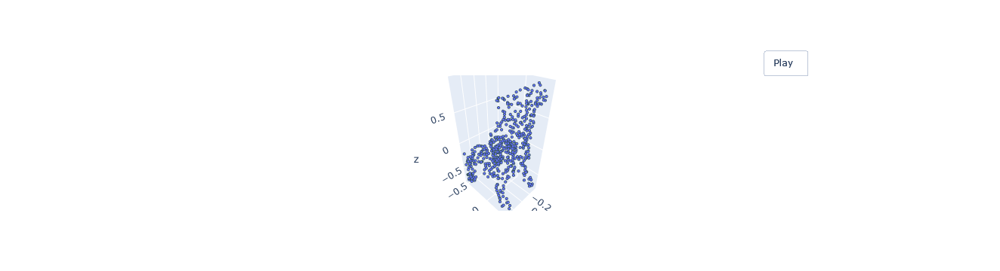

In [43]:
test2 = PointCloudData(path).__getitem__(881)['pointcloud']
pcshow(*test2.T)

In [44]:
def train(model, train_loader, val_loader=None,  epochs=3, save=True):
    for epoch in range(epochs):
        pointnet.train()
        running_loss = 0.0
        for i, data in enumerate(train_loader, 0):
            inputs, labels = data['pointcloud'].to(device).float(), data['category'].to(device)
            optimizer.zero_grad()
            outputs, m3x3, m64x64 = pointnet(inputs.transpose(1,2))

            loss = pointnetloss(outputs, labels, m3x3, m64x64)
            loss.backward()
            optimizer.step()

            # print statistics
            running_loss += loss.item()
            if i % 10 == 9:    # print every 10 mini-batches
                    print('[Epoch: %d, Batch: %4d / %4d], loss: %.3f' %
                        (epoch + 1, i + 1, len(train_loader), running_loss / 10))
                    running_loss = 0.0

        pointnet.eval()
        correct = total = 0

        # validation
        if val_loader:
            with torch.no_grad():
                for data in val_loader:
                    inputs, labels = data['pointcloud'].to(device).float(), data['category'].to(device)
                    outputs, __, __ = pointnet(inputs.transpose(1,2))
                    
                    _, predicted = torch.max(outputs.data, 1)
                    total += labels.size(0)
                    correct += (predicted == labels).sum().item()
                    val_acc = 100. * correct / total
                    print('Valid accuracy: %d %%' % val_acc)

        # save the model
        if save:
            torch.save(pointnet.state_dict(), "100_points_3_epoch_save_"+str(epoch)+".pth")

# SHAP

In [45]:
# train(pointnet, train_loader, valid_loader,  save=False)

In [46]:
from sklearn.metrics import confusion_matrix

In [47]:
pointnet = PointNet()
# loadsave = pointnet.load_state_dict(torch.load('100_points_3_epoch_save.pth'))
loadsave = pointnet.load_state_dict(torch.load('save.pth',map_location=torch.device('cpu') ))
# pointnet.eval()
print(type(loadsave))
print(loadsave)

<class 'torch.nn.modules.module._IncompatibleKeys'>
<All keys matched successfully>


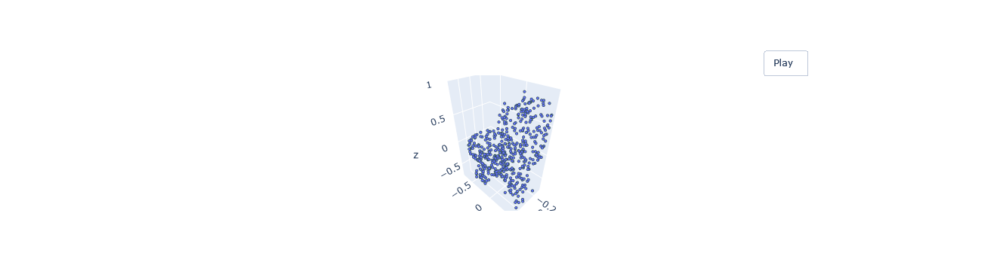

In [67]:
instance = PointCloudData(path).__getitem__(3886)['pointcloud']
pcshow(*instance.T)

In [68]:
# instance = torch.load('instancefile.pt')
# pcshow(*instance.T)

# SHAP implementation

In [69]:
import numpy as np
import torch

# Define your PointNet model and load it
# pointnet = ...  # Your PointNet model instance
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Assuming 'pointnet' is a loaded instance of your PointNet model
# Ensure the model is on the correct device
pointnet = pointnet.to(device)

def predict(point_cloud):
    if point_cloud.ndim == 2:  # Check if the point cloud is 2D
        point_cloud_tensor = torch.tensor(point_cloud, dtype=torch.float32, device=device).unsqueeze(0)  # Shape: (1, N, 3)
    elif point_cloud.ndim == 3:  # Already has the batch dimension
        point_cloud_tensor = torch.tensor(point_cloud, dtype=torch.float32, device=device)
    else:
        raise ValueError("Unexpected point cloud dimensions")

    # Transpose to match PointNet input requirements
    point_cloud_tensor = point_cloud_tensor.transpose(1, 2)  # Shape: (1, 3, N)

    if point_cloud_tensor.shape[-1] == 0:
        raise ValueError("Point cloud tensor is empty or has insufficient points.")

    pointnet.eval()  # Set model to evaluation mode

    with torch.no_grad():
        outputs, _, _ = pointnet(point_cloud_tensor)
        probabilities = torch.nn.functional.softmax(outputs, dim=1)

    # Assuming we want the maximum probability for simplicity
    max_prob = probabilities.max().item()
    # print(f"Predicted max probability: {max_prob}")

    return max_prob  # Return the maximum probability as a scalar

# Define the reward function
def reward_function(point_cloud_subset):
    if len(point_cloud_subset) == 0:
        return 0.0  # Handle the case where the subset is empty
    # Get the prediction from the PointNet model
    prediction = predict(point_cloud_subset)
    # print(f"Reward for subset: {prediction}")
    return prediction

# Monte Carlo estimation of Shapley values
def shapley_values(point_cloud, num_samples=512):
    num_points = point_cloud.shape[0]
    shapley_values = np.zeros(num_points)
    
    for i in range(num_points):
        print(f"Calculating Shapley value for point {i+1}/{num_points}")
        marginal_contributions = []
        for sample in range(num_samples):
            # print(f"  Sample {sample+1}/{num_samples}")
            # Randomly permute points
            
            perm = np.random.permutation(num_points)
            subset = []
            for j in perm:
                if j == i:
                    # Calculate the marginal contribution
                    subset_with_j = np.vstack((subset, point_cloud[j].numpy())) if subset else point_cloud[j].numpy().reshape(1, -1)
                    subset_tensor = np.vstack(subset) if subset else np.array([])
                    marginal_contribution = reward_function(subset_with_j) - reward_function(subset_tensor)
                    marginal_contributions.append(marginal_contribution)
                    # print(f"    Marginal contribution for point {i}: {marginal_contribution}")
                    break
                subset.append(point_cloud[j].numpy())
        
        shapley_values[i] = np.mean(marginal_contributions)
        print(f"Shapley value for point {i}: {shapley_values[i]}")
    
    return shapley_values

# Example usage
point_cloud = instance  # Replace this with your actual point cloud data
shap_values = shapley_values(point_cloud)
print("Shapley values:", shap_values)


Calculating Shapley value for point 1/512
Shapley value for point 0: 0.0013047107495367527
Calculating Shapley value for point 2/512
Shapley value for point 1: 0.002046082401648164
Calculating Shapley value for point 3/512
Shapley value for point 2: -0.00013649329775944352
Calculating Shapley value for point 4/512
Shapley value for point 3: 0.0033621079055592418
Calculating Shapley value for point 5/512
Shapley value for point 4: 0.0028846486820839345
Calculating Shapley value for point 6/512
Shapley value for point 5: 0.0005491236224770546
Calculating Shapley value for point 7/512
Shapley value for point 6: 0.004081536957528442
Calculating Shapley value for point 8/512
Shapley value for point 7: -0.0005681016482412815
Calculating Shapley value for point 9/512
Shapley value for point 8: 0.0017656168201938272
Calculating Shapley value for point 10/512
Shapley value for point 9: 0.0025201623793691397
Calculating Shapley value for point 11/512
Shapley value for point 10: -0.00097868230659

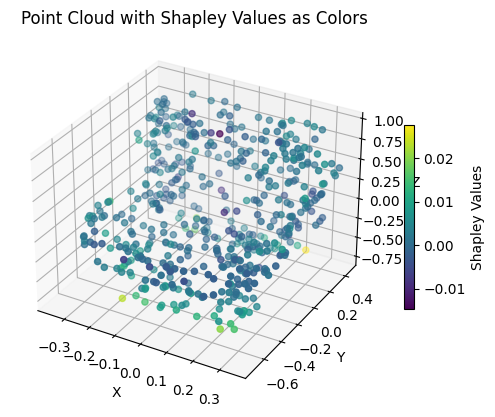

In [70]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import time

# Plotting the point cloud with Shapley values as colors
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Normalize shapley values for better color mapping
norm = plt.Normalize(shap_values.min(), shap_values.max())

# Scatter plot
sc = ax.scatter(point_cloud[:, 0], point_cloud[:, 1], point_cloud[:, 2], c=shap_values, cmap='viridis', norm=norm)

# Color bar
cb = plt.colorbar(sc, ax=ax, shrink=0.5)
cb.set_label('Shapley Values')

# Labels
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Point Cloud with Shapley Values as Colors')
plt.savefig(f'IMages/PAIN/singleplot{int(time.time())}.png')

plt.show()

# vis

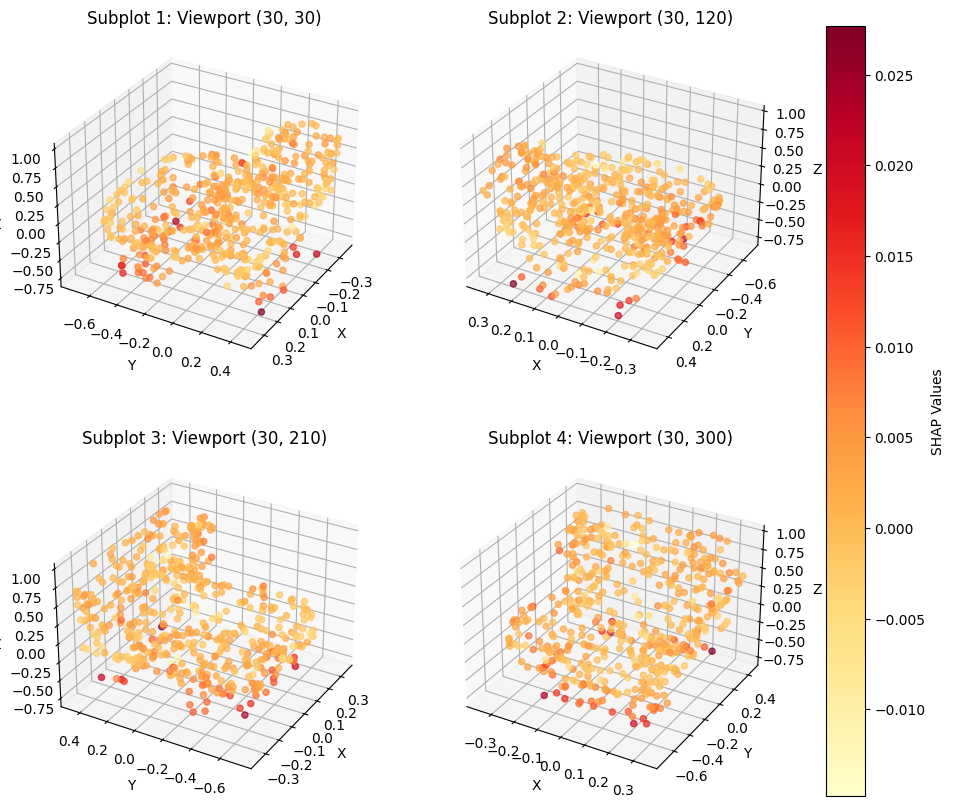

In [71]:

# Plotting the point cloud with Shapley values as colors in four subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10), subplot_kw={'projection': '3d'})

# Normalize shapley values for better color mapping
norm = plt.Normalize(shap_values.min(), shap_values.max())

# Create subplots with different viewports (angles)
viewports = [(30, 30), (30, 120), (30, 210), (30, 300)]
for i, ax in enumerate(axs.flat):
    ax.scatter(point_cloud[:, 0], point_cloud[:, 1], point_cloud[:, 2], c=shap_values, alpha=0.7, cmap='YlOrRd', norm=norm)
    ax.view_init(elev=viewports[i][0], azim=viewports[i][1])
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(f'Subplot {i+1}: Viewport ({viewports[i][0]}, {viewports[i][1]})')

# Color bar
cb = fig.colorbar(plt.cm.ScalarMappable(cmap='YlOrRd', norm=norm), ax=axs.ravel().tolist())
cb.set_label('SHAP Values')
plt.savefig(f'IMages/PAIN/512points/{int(time.time())}.png')

# plt.tight_layout()
plt.show()

In [53]:
print(type(instance))

<class 'torch.Tensor'>


In [54]:
# torch.save(instance, 'instancefile.pt')


In [55]:
# ha = torch.load('instancefile.pt')
# print(*ha)

In [56]:
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D

# # Create a figure
# fig = plt.figure(figsize=(12, 12))

# # Define the viewpoints
# viewpoints = [(30, 30), (30, 120), (30, 210), (30, 300)]

# # Define a list of color maps
# color_maps = ['Greys', 'Greens', 'Oranges','Blues', 'Reds', 'Purples']

# # List of batch keys
# batch_keys = list(xyz_dict.keys())

# # Select only the first three batches
# selected_batches = batch_keys[:6]

# # Create a dictionary to store the scatter plots for the color bars
# scatter_plots = {}

# # Iterate through each viewpoint to create a subplot
# for i, (elev, azim) in enumerate(viewpoints):
#     ax = fig.add_subplot(2, 2, i + 1, projection='3d')

#     # Iterate through the selected batches for the current subplot
#     for j, key in enumerate(selected_batches):
#         xyz = xyz_dict[key]
#         color = color_dict[key]

#         # Plot each point with its corresponding color
#         sc = ax.scatter(xyz[:, 0], xyz[:, 1], xyz[:, 2], c=color, cmap=color_maps[j], label=key)
#         scatter_plots[key] = sc  # Store the scatter plot

#     # Set the viewing angle
#     ax.view_init(elev=elev, azim=azim)

#     # Add labels
#     ax.set_xlabel('X')
#     ax.set_ylabel('Y')
#     ax.set_zlabel('Z')
#     ax.set_title(f'View {i+1}: Elev={elev}, Azim={azim}')

#     # Add legend
#     ax.legend()

# # Add color bars (one for each selected batch, below the subplots)
# fig.subplots_adjust(right=0.8)
# for j, key in enumerate(selected_batches):
#     cbar_ax = fig.add_axes([0.85, 0.15 + j * 0.2, 0.05, 0.15])
#     cbar = plt.colorbar(scatter_plots[key], cax=cbar_ax)
#     cbar.set_label(f'{key} Classification Contribution')

# # Save and show the plot
# plt.savefig('IMages/18to24_888_chair_instance_multiple_batches_multiple_views.png')
# plt.show()

# # Print the values in xyz_dict and color_dict (for debugging)
# for key in selected_batches:
#     xyz = xyz_dict[key]
#     color = color_dict[key]
#     # print(f'Key: {key}')
#     # print('XYZ:', xyz)
#     # print('Color:', color)


In [57]:
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D

# # Create a figure
# fig = plt.figure(figsize=(12, 12))

# # Define the viewpoints
# viewpoints = [(30, 30), (30, 120), (30, 210), (30, 300)]

# # Define a list of color maps
# color_maps = ['viridis', 'plasma', 'inferno']

# # List of batch keys
# batch_keys = list(xyz_dict.keys())

# # Define combinations of batches to be plotted together
# combinations = [
#     (batch_keys[0], batch_keys[1]),  # First and second batch
#     (batch_keys[0], batch_keys[2]),  # First and third batch
#     (batch_keys[1], batch_keys[2]),  # Second and third batch
#     (batch_keys[0], batch_keys[1], batch_keys[2])  # All three batches
# ]

# # Iterate through each viewpoint to create a subplot
# for i, (elev, azim) in enumerate(viewpoints):
#     ax = fig.add_subplot(2, 2, i + 1, projection='3d')

#     # Iterate through the combination of batches for the current subplot
#     for j, key in enumerate(combinations[i]):
#         xyz = xyz_dict[key]
#         color = color_dict[key]

#         # Plot each point with its corresponding color
#         sc = ax.scatter(xyz[:, 0], xyz[:, 1], xyz[:, 2], c=color, cmap=color_maps[j % len(color_maps)], label=key)

#     # Set the viewing angle
#     ax.view_init(elev=elev, azim=azim)

#     # Add labels
#     ax.set_xlabel('X')
#     ax.set_ylabel('Y')
#     ax.set_zlabel('Z')
#     ax.set_title(f'View {i+1}: Elev={elev}, Azim={azim}')

#     # Add legend
#     ax.legend()

# # Add color bars (one for each batch combination, below the subplots)
# fig.subplots_adjust(right=0.8)
# cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])

# # For the color bar, we will show it for the first batch in the first combination
# cbar = plt.colorbar(sc, cax=cbar_ax)
# cbar.set_label('Classification Contribution Value')

# # Save and show the plot
# plt.savefig('IMages/888_chair_instance_multiple_batches_multiple_views.png')
# plt.show()

# # Print the values in xyz_dict and color_dict (for debugging)
# for key in xyz_dict.keys():
#     xyz = xyz_dict[key]
#     color = color_dict[key]
#     # print(f'Key: {key}')
#     # print('XYZ:', xyz)
#     # print('Color:', color)


In [58]:
# # SIngle batch
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D

# # Create a figure
# fig = plt.figure(figsize=(12, 12))

# # Define the viewpoints
# viewpoints = [(30, 30), (30, 120), (30, 210), (30, 300)]

# # Iterate through each viewpoint to create a subplot
# for i, (elev, azim) in enumerate(viewpoints):
#     ax = fig.add_subplot(2, 2, i + 1, projection='3d')

#     # Iterate through each batch in xyz_dict and color_dict
#     for key in xyz_dict.keys():
#         xyz = xyz_dict['batch_1']
#         color = color_dict['batch_1']

#         # Plot each point with its corresponding color
#         ax.scatter(xyz[:, 0], xyz[:, 1], xyz[:, 2], c=color, cmap='viridis')

#     # Set the viewing angle
#     ax.view_init(elev=elev, azim=azim)

#     # Add labels
#     ax.set_xlabel('X')
#     ax.set_ylabel('Y')
#     ax.set_zlabel('Z')
#     ax.set_title(f'View {i+1}: Elev={elev}, Azim={azim}')

# # Add color bar (only once, below the subplots)
# fig.subplots_adjust(right=0.8)
# cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
# cbar = plt.colorbar(ax.scatter([], [], [], c=[], cmap='viridis'), cax=cbar_ax)
# cbar.set_label('Classification Contribution Value')

# # Save and show the plot
# plt.savefig('IMages/single_batch_plot_888_chair_instance_16ppbatch_1024points_multiple_views.png')
# plt.show()

# # Print the values in xyz_dict and color_dict (for debugging)
# for key in xyz_dict.keys():
#     xyz = xyz_dict[key]
#     color = color_dict[key]
#     # print(f'Key: {key}')
#     # print('XYZ:', xyz)
#     # print('Color:', color)


In [59]:
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D

# # Create a figure
# fig = plt.figure(figsize=(12, 12))

# # Define the viewpoints
# viewpoints = [(30, 30), (30, 120), (30, 210), (30, 300)]

# # Iterate through each viewpoint to create a subplot
# for i, (elev, azim) in enumerate(viewpoints):
#     ax = fig.add_subplot(2, 2, i + 1, projection='3d')

#     # Iterate through each batch in xyz_dict and color_dict
#     for key in xyz_dict.keys():
#         xyz = xyz_dict[key]
#         color = color_dict[key]
        

#         # Plot each point with its corresponding color
#         ax.scatter(xyz[:, 0], xyz[:, 1], xyz[:, 2], c=color, cmap='gist_stern')

#     # Set the viewing angle
#     ax.view_init(elev=elev, azim=azim)

#     # Add labels
#     ax.set_xlabel('X')
#     ax.set_ylabel('Y')
#     ax.set_zlabel('Z')
#     ax.set_title(f'View {i+1}: Elev={elev}, Azim={azim}')

# # Add color bar (only once, below the subplots)
# fig.subplots_adjust(right=0.8)
# cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
# cbar = plt.colorbar(ax.scatter([], [], [], c=[], cmap='gist_stern'), cax=cbar_ax)
# cbar.set_label('Classification Contribution Value')

# # Save and show the plot
# plt.savefig(f'IMages/{int(time.time())}gogo_888_chair_instance_16ppbatch_1024points_multiple_views.png')
# plt.show()

# # Print the values in xyz_dict and color_dict (for debugging)
# for key in xyz_dict.keys():
#     xyz = xyz_dict[key]
#     color = color_dict[key]
#     # print(f'Key: {key}')
#     # print('XYZ:', xyz)
#     # print('Color:', color)


In [60]:
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D

# # Create a figure
# fig = plt.figure(figsize=(12, 12))

# # Define the viewpoints
# viewpoints = [(30, 30), (30, 120), (30, 210), (30, 300)]

# # Iterate through each viewpoint to create a subplot
# for i, (elev, azim) in enumerate(viewpoints):
#     ax = fig.add_subplot(2, 2, i + 1, projection='3d')

#     # Iterate through each batch in xyz_dict and color_dict
#     for key in xyz_dict.keys():
#         xyz = xyz_dict[key]
#         color = color_dict[key]
        

#         # Plot each point with its corresponding color
#         ax.scatter(xyz[:, 0], xyz[:, 1], xyz[:, 2], c=color, cmap='gist_stern')

#     # Set the viewing angle
#     ax.view_init(elev=elev, azim=azim)

#     # Add labels
#     ax.set_xlabel('X')
#     ax.set_ylabel('Y')
#     ax.set_zlabel('Z')
#     ax.set_title(f'View {i+1}: Elev={elev}, Azim={azim}')

# # Add color bar (only once, below the subplots)
# fig.subplots_adjust(right=0.8)
# cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
# cbar = plt.colorbar(ax.scatter([], [], [], c=[], cmap='gist_stern'), cax=cbar_ax)
# cbar.set_label('Classification Contribution Value')

# # Save and show the plot
# plt.savefig(f'IMages/{int(time.time())}gogo_888_chair_instance_16ppbatch_1024points_multiple_views.png')
# plt.show()

# # Print the values in xyz_dict and color_dict (for debugging)
# for key in xyz_dict.keys():
#     xyz = xyz_dict[key]
#     color = color_dict[key]
#     # print(f'Key: {key}')
#     # print('XYZ:', xyz)
#     # print('Color:', color)


In [61]:
# #all points highlight one batch
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D

# # Create a figure
# fig = plt.figure(figsize=(12, 12))

# # Define the viewpoints
# viewpoints = [(30, 30), (30, 120), (30, 210), (30, 300)]

# # Iterate through each viewpoint to create a subplot
# for i, (elev, azim) in enumerate(viewpoints):
#     ax = fig.add_subplot(2, 2, i + 1, projection='3d')

#     # Iterate through each batch in xyz_dict and color_dict
#     for key in xyz_dict.keys():
#         xyz = xyz_dict[key]
#         if key == 'batch_1':
#             # Plot the single batch in bright pink
#               ax.scatter(xyz[:, 0], xyz[:, 1], xyz[:, 2], c='lime', alpha=1.0 ,label=key)
#         else:
#             color = color_dict[key]
#             # Plot each point with its corresponding color
#             sc = ax.scatter(xyz[:, 0], xyz[:, 1], xyz[:, 2], c=color, alpha=0.5, cmap='Greys', label=key)


#     # Set the viewing angle
#     ax.view_init(elev=elev, azim=azim)

#     # Add labels
#     ax.set_xlabel('X')
#     ax.set_ylabel('Y')
#     ax.set_zlabel('Z')
#     ax.set_title(f'View {i+1}: Elev={elev}, Azim={azim}')

# # Add color bar (only once, below the subplots)
# fig.subplots_adjust(right=0.8)
# cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
# cbar = plt.colorbar(ax.scatter([], [], [], c=[], cmap='Greys'), cax=cbar_ax)
# cbar.set_label('Classification Contribution Value')

# # Save and show the plot
# plt.savefig(f'IMages/{int(time.time())}og_batchesi_888_chair_instance_16ppbatch_1024points_multiple_views.png')
# plt.show()

# # Print the values in xyz_dict and color_dict (for debugging)
# for key in xyz_dict.keys():
#     xyz = xyz_dict[key]
#     # color = color_dict[key]
#     # print(f'Key: {key}')
#     # print('XYZ:', xyz)
#     # print('Color:', color)
